# Introduction
This repository contains the codebase for an advanced video analysis pipeline that combines the power of multiple state-of-the-art models and methodologies including YOLO V8, ByteTrack, Movenet, and Transformer encoders for high-accuracy activity recognition. The pipeline is trained on the Human Activity Recognition (HAR - Video Dataset)

Reference:
Datasets: https://www.kaggle.com/datasets/sharjeelmazhar/human-activity-recognition-video-dataset?resource=download-directory

In [1]:
!python -V

Python 3.10.13


In [2]:
!nvidia-smi

Wed Oct 18 15:24:48 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 522.06       Driver Version: 522.06       CUDA Version: 11.8     |
|-------------------------------+----------------------+----------------------+
| GPU  Name            TCC/WDDM | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA GeForce ... WDDM  | 00000000:07:00.0  On |                  N/A |
|  0%   39C    P3    23W / 130W |   1371MiB /  8192MiB |     19%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------



# Install Dependencies

In [3]:
!pip install --upgrade pip
!pip install tensorflow==2.12.0
!pip install torch
!pip install torchvision
!pip install opencv-python-headless
!pip install numpy==1.23.5
!pip install opencv-python

!pip install imageio
!pip install opencv-python
!pip install git+https://github.com/tensorflow/docs
!pip install git+https://github.com/huggingface/transformers

!pip install timm
!pip install scikit-learn 
!pip install keras

!pip install matplotlib>=3.3.0
!pip install opencv-python>=4.6.0
!pip install pillow>=7.1.2
!pip install pyyaml>=5.3.1
!pip install requests>=2.23.0
!pip install scipy>=1.4.1
!pip install torch>=1.8.0
!pip install torchvision>=0.9.0
!pip install tqdm>=4.64.0

!pip install pandas>=1.1.4
!pip install seaborn>=0.11.0

!pip install psutil
!pip install py-cpuinfo
!pip install thop>=0.1.1
!pip install ultralytics

#  Import Dependencies

In [4]:
# Standard Library Imports
import os
import torch
import torch.nn as nn
import torchvision.models as models
from torch.nn import TransformerEncoder, TransformerEncoderLayer
import tensorflow as tf
import numpy as np
import random
import gc
gc.enable()

# Third-party Libraries
import ultralytics
ultralytics.checks()
from ultralytics import YOLO
from sklearn.model_selection import train_test_split
from tensorflow import keras
from predict import GradCAM

# Constants or Configuration
from torchvision.models.resnet import ResNet152_Weights

Ultralytics YOLOv8.0.199  Python-3.10.13 torch-2.0.0+cpu CPU (AMD Ryzen 5 5600X 6-Core Processor)
Setup complete  (12 CPUs, 31.9 GB RAM, 440.0/465.0 GB disk)


In [8]:
video_path = 'C:/Users/Duc Anh/Desktop/Activity-Recogntion//final/luan.mp4'
output_video = 'test.mp4'

# Datasets
DATASET_DIR = 'C:/Users/Duc Anh/Desktop/Activity-Recogntion/datasets/Human Activity Recognition - Video Dataset'
CLASSES_LIST = sorted([entry.name for entry in os.scandir(DATASET_DIR) if entry.is_dir()])
print(CLASSES_LIST)

['Clapping', 'Meet and Split', 'Sitting', 'Standing Still', 'Walking', 'Walking While Reading Book', 'Walking While Using Phone']


# Initialize Model


In [9]:
%cd "C:/Users/Duc Anh/Desktop/Activity-Recogntion/final/"

# Initialize YOLO model
yolo_model = YOLO('yolov8x.pt')
# yolo_model.to('cuda')

# For spatial features
spatial_resnet_full = models.resnet152(weights=ResNet152_Weights.IMAGENET1K_V1)
spatial_resnet = nn.Sequential(*list(spatial_resnet_full.children())[:-1])  # Retains the ResNet structure without the classifier
spatial_resnet.eval()

# For temporal features
temporal_resnet_full = models.resnet152(weights=ResNet152_Weights.IMAGENET1K_V1)
temporal_resnet = nn.Sequential(*list(temporal_resnet_full.children())[:-1])
temporal_resnet.eval()


# Define Transformer Encoders
# fewer attention heads for spatial model
spatial_encoder_layers = TransformerEncoderLayer(d_model=2048, nhead=4)  # fewer attention heads for spatial model
spatial_transformer = TransformerEncoder(spatial_encoder_layers, num_layers=2)

# more attention heads for temporal model
temporal_encoder_layers = TransformerEncoderLayer(d_model=2048, nhead=16)  # more attention heads for temporal model
temporal_transformer = TransformerEncoder(temporal_encoder_layers, num_layers=2)

# Load trained model
# Load the state dict previously saved 
dense_model_name = 'dense_model.h5'
dense_model = keras.models.load_model(dense_model_name)

lstm_model_name = 'lstm_model.h5'
lstm_model = keras.models.load_model(lstm_model_name)

cnn_model_name = 'cnn_model.h5'
cnn_model = keras.models.load_model(cnn_model_name)

# Initialize GradCAM with the ResNet model and the target layer
target_layer = spatial_resnet_full.layer4[-1]
grad_cam = GradCAM(spatial_resnet_full, target_layer)

C:\Users\Duc Anh\Desktop\Activity-Recogntion\final


# Predict on video

Extracting frames from video...
Processing frame...
Processing frame 0



0: 640x384 1 person, 2 chairs, 798.7ms
Speed: 64.5ms preprocess, 798.7ms inference, 16.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


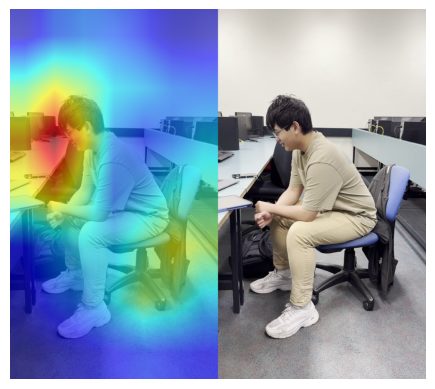

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 666.2ms
Speed: 45.1ms preprocess, 666.2ms inference, 3.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


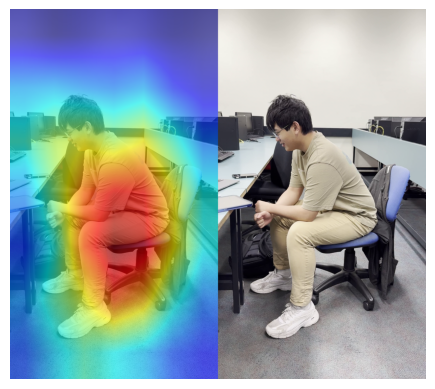

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 666.4ms
Speed: 40.0ms preprocess, 666.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


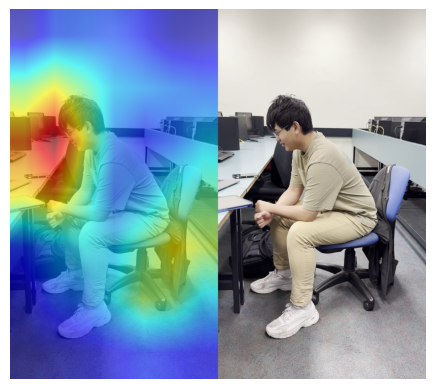

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 662.4ms
Speed: 41.0ms preprocess, 662.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


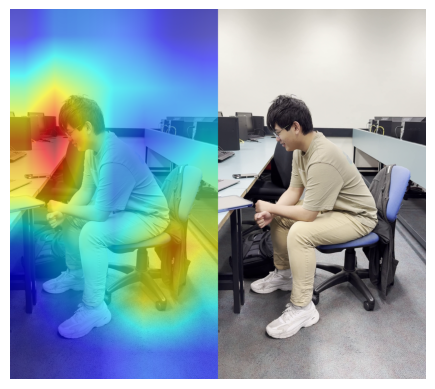

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 647.3ms
Speed: 77.0ms preprocess, 647.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


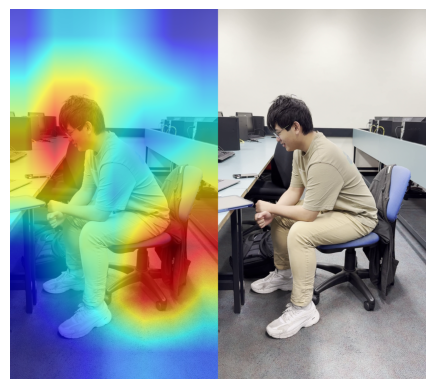

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 678.7ms
Speed: 41.0ms preprocess, 678.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


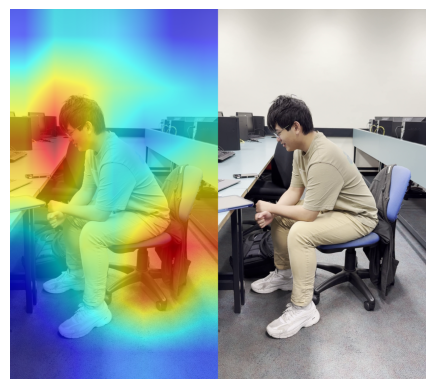

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 647.2ms
Speed: 45.0ms preprocess, 647.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


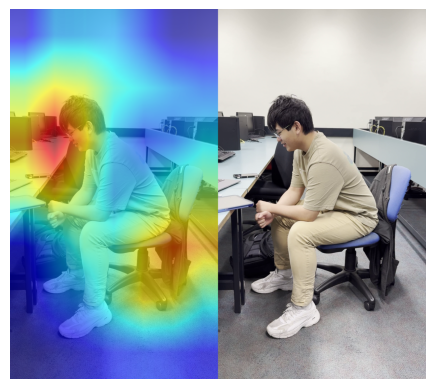

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 655.2ms
Speed: 51.0ms preprocess, 655.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


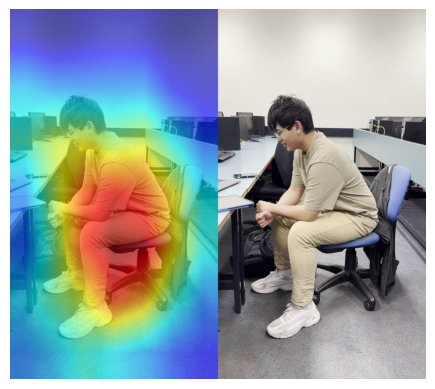

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 659.2ms
Speed: 39.0ms preprocess, 659.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


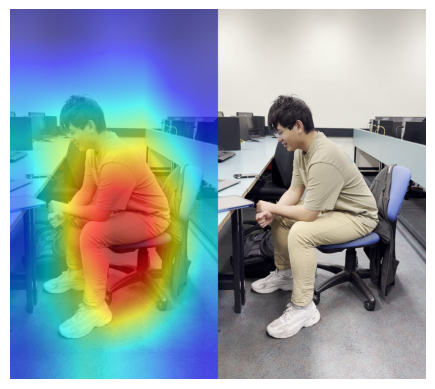

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 658.7ms
Speed: 39.5ms preprocess, 658.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


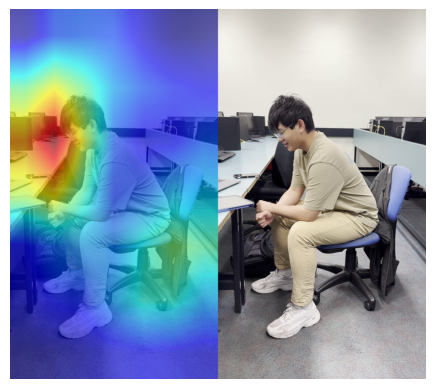

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 751.0ms
Speed: 43.0ms preprocess, 751.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


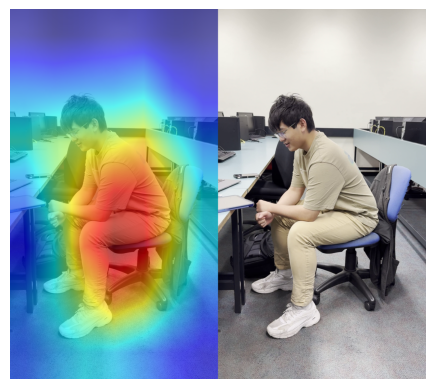

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 637.7ms
Speed: 32.0ms preprocess, 637.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


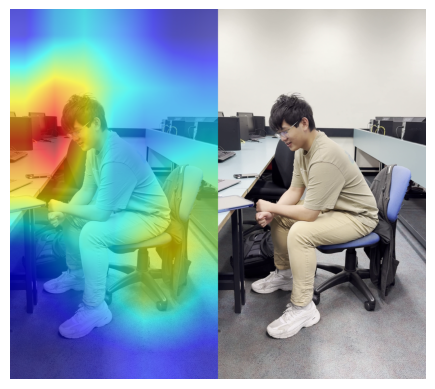

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 636.9ms
Speed: 30.0ms preprocess, 636.9ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


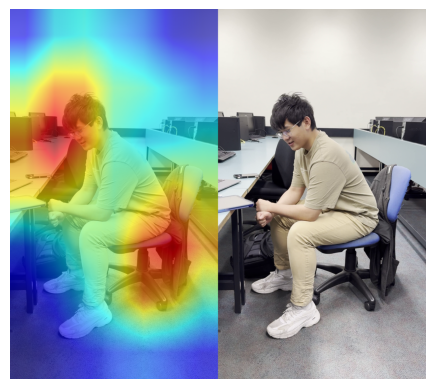

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 655.0ms
Speed: 32.5ms preprocess, 655.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


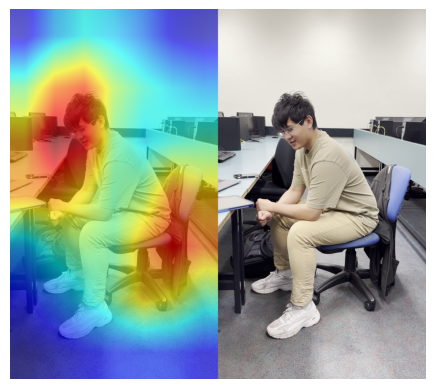

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 631.2ms
Speed: 30.0ms preprocess, 631.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


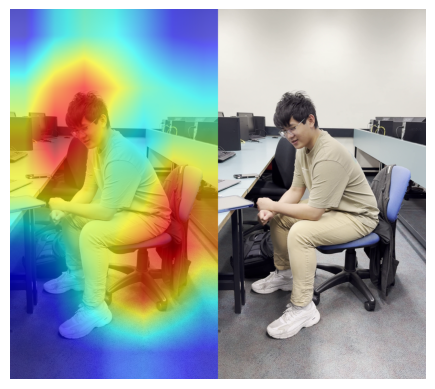

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 645.7ms
Speed: 30.0ms preprocess, 645.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


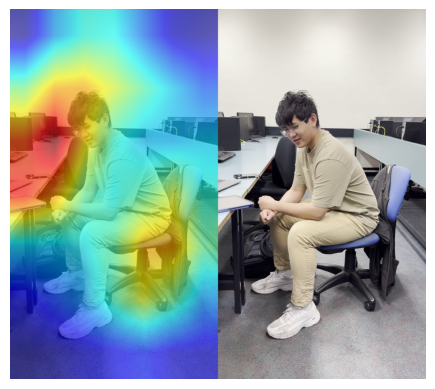

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 653.7ms
Speed: 29.0ms preprocess, 653.7ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


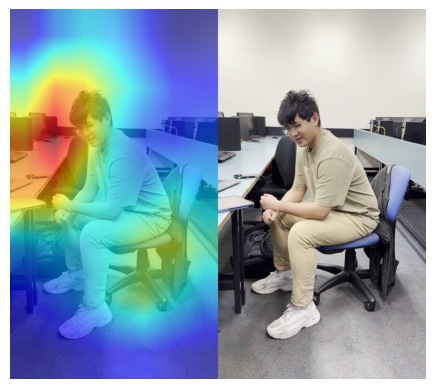

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 668.4ms
Speed: 31.0ms preprocess, 668.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


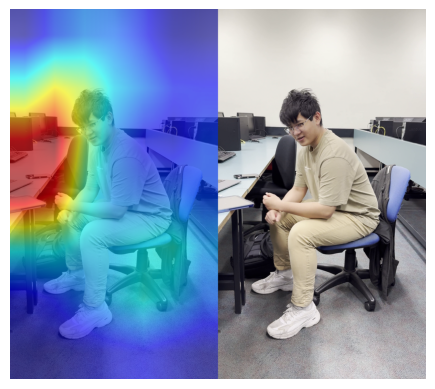

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 603.2ms
Speed: 30.0ms preprocess, 603.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


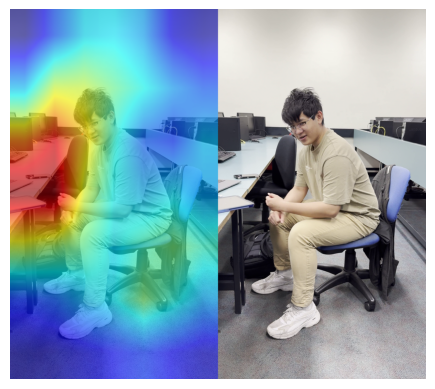

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 618.2ms
Speed: 31.0ms preprocess, 618.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


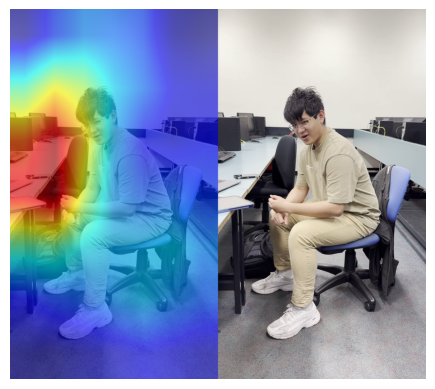

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 612.2ms
Speed: 29.0ms preprocess, 612.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


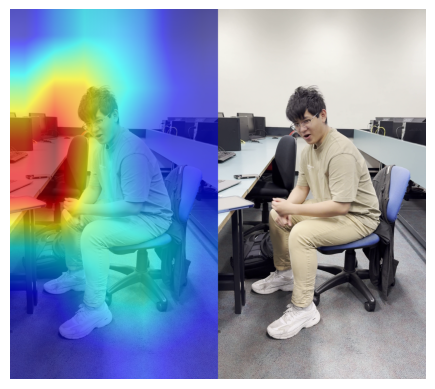

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 620.7ms
Speed: 29.0ms preprocess, 620.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


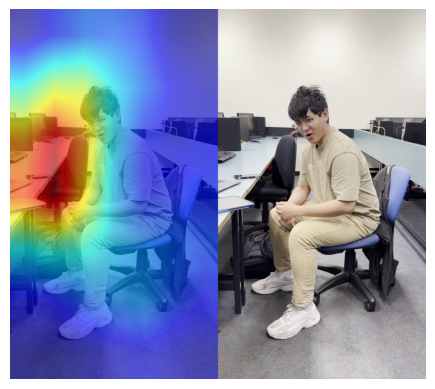

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 601.4ms
Speed: 29.0ms preprocess, 601.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


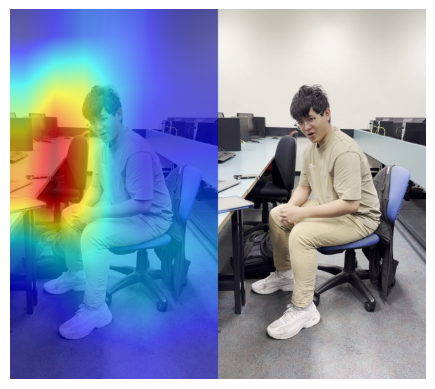

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 603.2ms
Speed: 29.0ms preprocess, 603.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


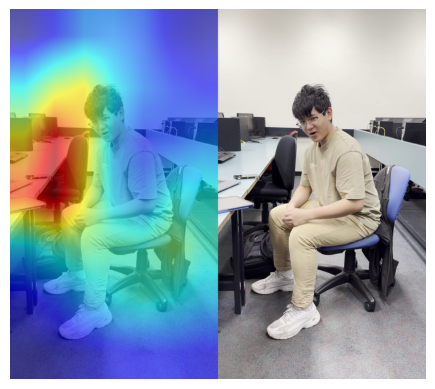

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 603.8ms
Speed: 30.0ms preprocess, 603.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


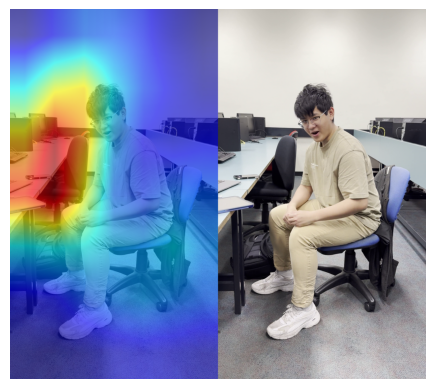

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 603.7ms
Speed: 29.4ms preprocess, 603.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


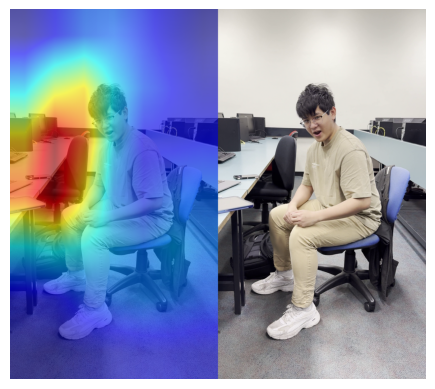

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 609.7ms
Speed: 29.0ms preprocess, 609.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


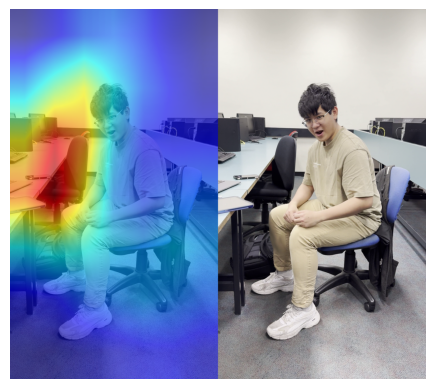

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 610.2ms
Speed: 29.0ms preprocess, 610.2ms inference, 0.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


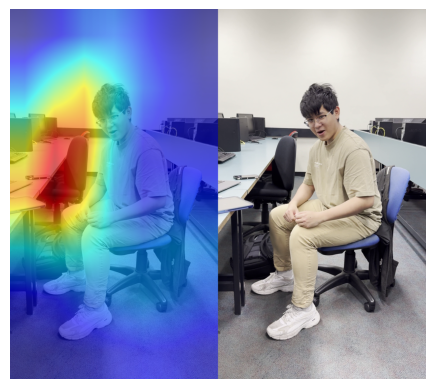

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 663.7ms
Speed: 30.0ms preprocess, 663.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


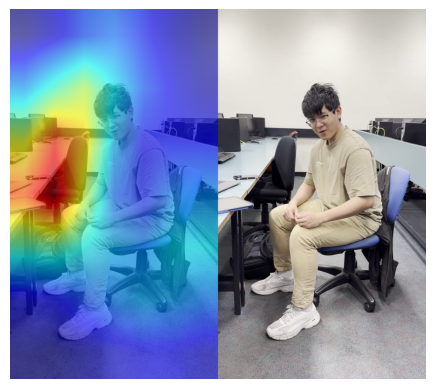

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 599.8ms
Speed: 30.0ms preprocess, 599.8ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


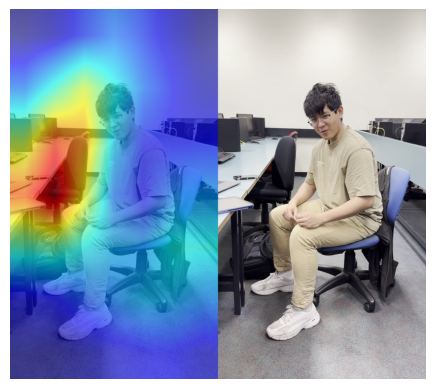

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 637.2ms
Speed: 28.0ms preprocess, 637.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


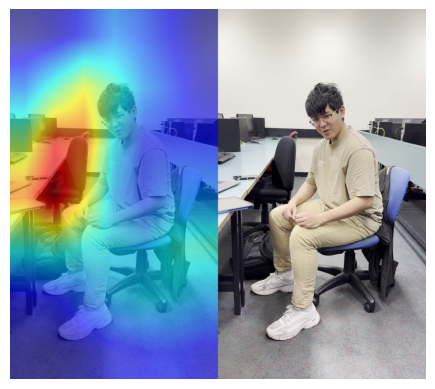

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 keyboard, 644.2ms
Speed: 28.5ms preprocess, 644.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


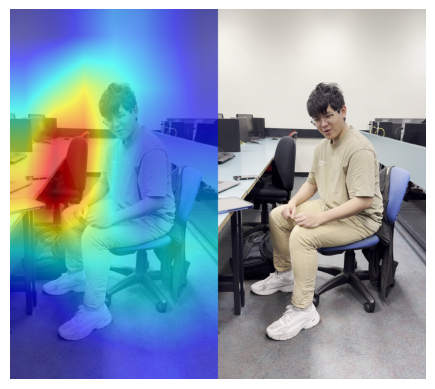

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 599.0ms
Speed: 28.0ms preprocess, 599.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


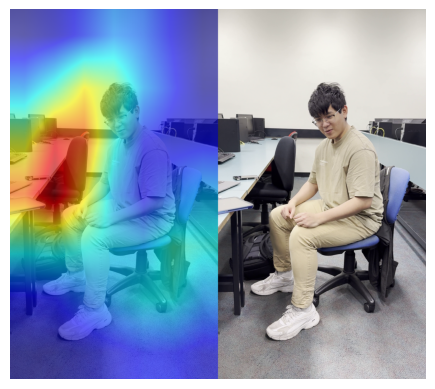

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 613.1ms
Speed: 29.5ms preprocess, 613.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


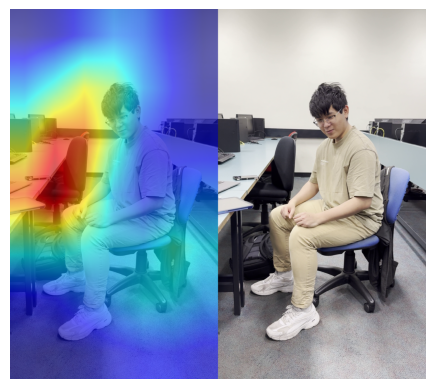

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 641.2ms
Speed: 28.5ms preprocess, 641.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


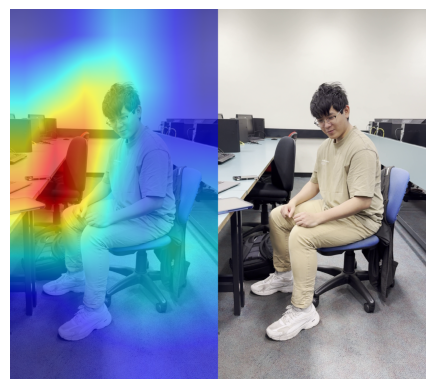

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 611.2ms
Speed: 29.0ms preprocess, 611.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


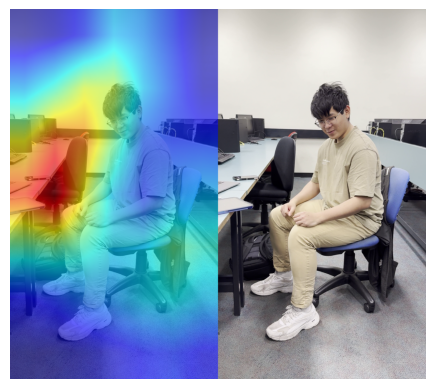

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 618.6ms
Speed: 30.0ms preprocess, 618.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


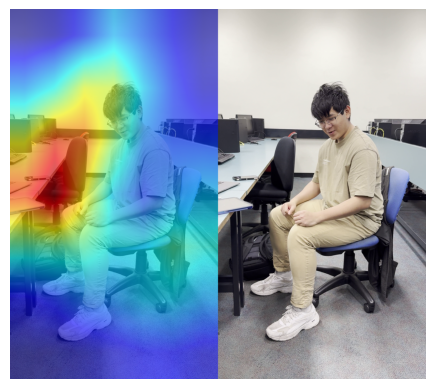

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 645.9ms
Speed: 30.2ms preprocess, 645.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


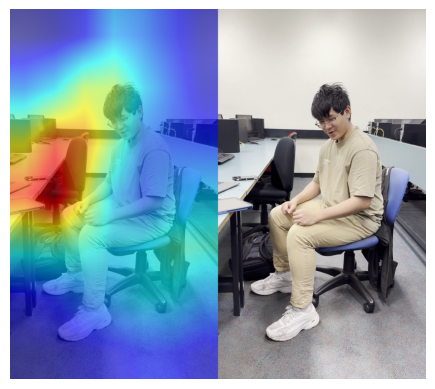

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 621.7ms
Speed: 28.0ms preprocess, 621.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


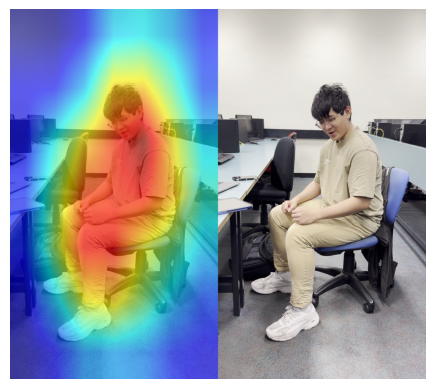

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 636.2ms
Speed: 29.1ms preprocess, 636.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


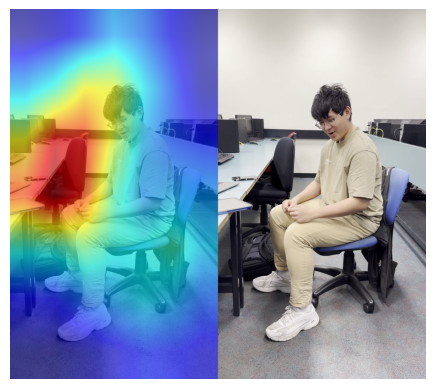

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 639.9ms
Speed: 32.0ms preprocess, 639.9ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


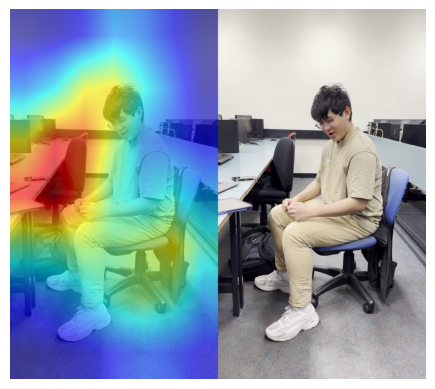

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 656.4ms
Speed: 30.0ms preprocess, 656.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


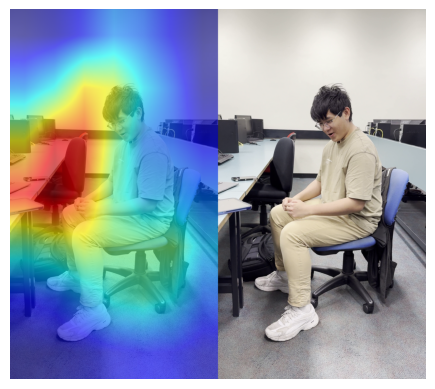

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 639.2ms
Speed: 29.5ms preprocess, 639.2ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


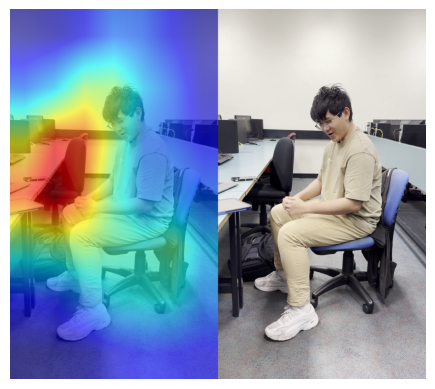

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 635.7ms
Speed: 29.0ms preprocess, 635.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


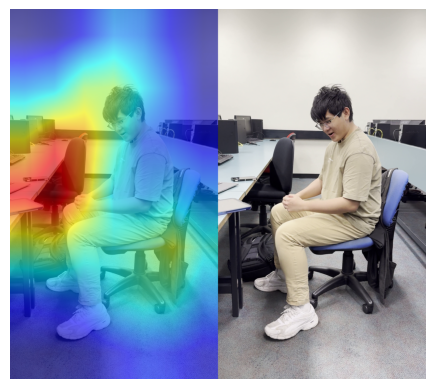

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 662.2ms
Speed: 30.5ms preprocess, 662.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


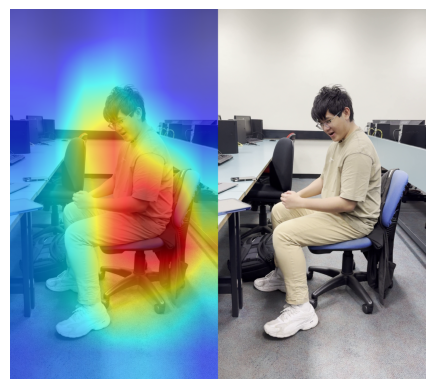

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 586.2ms
Speed: 29.0ms preprocess, 586.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


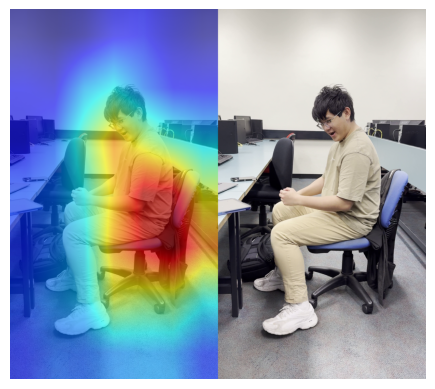

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 614.2ms
Speed: 29.0ms preprocess, 614.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


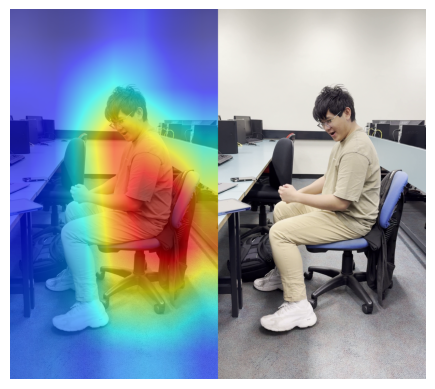

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 619.4ms
Speed: 28.0ms preprocess, 619.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


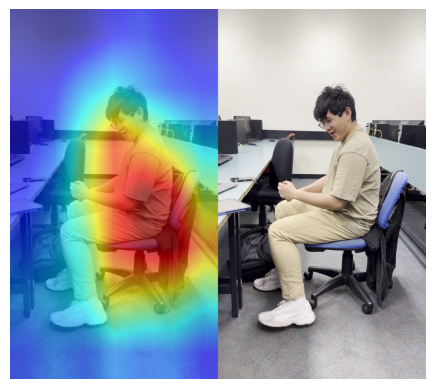

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 644.7ms
Speed: 29.0ms preprocess, 644.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...


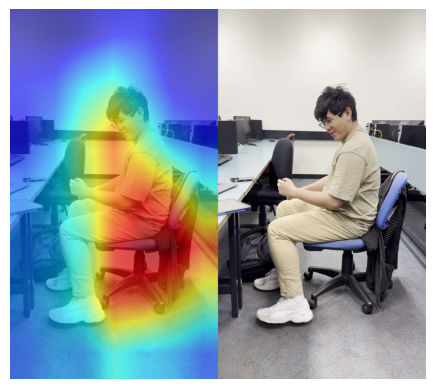

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 624.2ms
Speed: 29.0ms preprocess, 624.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...
Making prediction...
1/1 [==============================] - 0s 375ms/step
Soft Vote: Meet and Split
Hard Vote: Meet and Split

Model: LSTM
Clapping: 0.71%
Meet and Split: 87.77%
Sitting: 0.24%
Standing Still: 7.69%
Walking: 0.53%
Walking While Reading Book: 1.73%
Walking While Using Phone: 1.33%



Model: Dense
Clapping: 12.81%
Meet and Split: 14.84%
Sitting: 17.40%
Standing Still: 15.14%
Walking: 14.68%
Walking While Reading Book: 12.19%
Walking While Using Phone: 12.94%



Model: CNN
Clapping: 1.39%
Meet and Split: 46.18%
Sitting: 13.89%
Standing Still: 2.83%
Walking: 21.94%
Walking While Reading Book: 5.98%
Walking While Using Phone: 7.80%


Predicted: Meet and Split


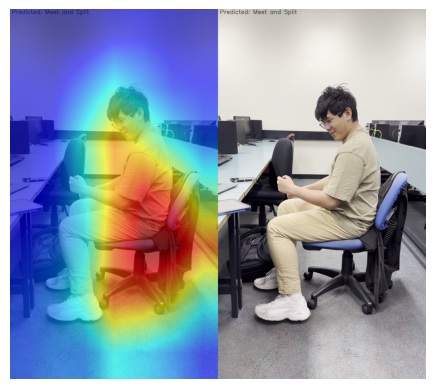

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 631.2ms
Speed: 29.0ms preprocess, 631.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...
Making prediction...
1/1 [==============================] - 0s 79ms/step
Soft Vote: Meet and Split
Hard Vote: Meet and Split

Model: LSTM
Clapping: 0.70%
Meet and Split: 86.80%
Sitting: 0.22%
Standing Still: 8.82%
Walking: 0.53%
Walking While Reading Book: 1.64%
Walking While Using Phone: 1.29%



Model: Dense
Clapping: 12.77%
Meet and Split: 15.12%
Sitting: 16.56%
Standing Still: 16.82%
Walking: 14.14%
Walking While Reading Book: 12.94%
Walking While Using Phone: 11.65%



Model: CNN
Clapping: 1.36%
Meet and Split: 40.99%
Sitting: 17.80%
Standing Still: 2.57%
Walking: 20.52%
Walking While Reading Book: 6.98%
Walking While Using Phone: 9.78%


Predicted: Meet and Split


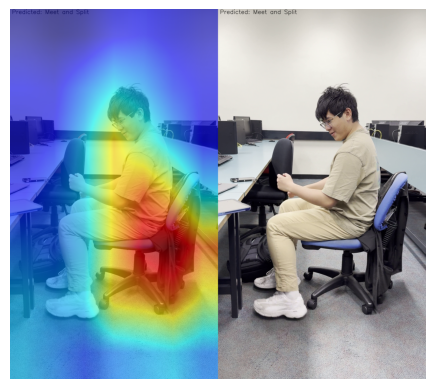

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 664.5ms
Speed: 29.0ms preprocess, 664.5ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...
Making prediction...
1/1 [==============================] - 0s 73ms/step
Soft Vote: Meet and Split
Hard Vote: Meet and Split

Model: LSTM
Clapping: 0.70%
Meet and Split: 85.55%
Sitting: 0.21%
Standing Still: 10.16%
Walking: 0.53%
Walking While Reading Book: 1.59%
Walking While Using Phone: 1.25%



Model: Dense
Clapping: 13.37%
Meet and Split: 16.08%
Sitting: 15.28%
Standing Still: 16.84%
Walking: 14.59%
Walking While Reading Book: 11.93%
Walking While Using Phone: 11.90%



Model: CNN
Clapping: 1.32%
Meet and Split: 41.30%
Sitting: 16.69%
Standing Still: 2.58%
Walking: 22.44%
Walking While Reading Book: 6.78%
Walking While Using Phone: 8.88%


Predicted: Meet and Split


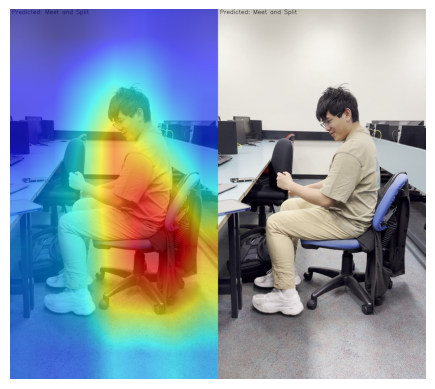

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 637.7ms
Speed: 29.0ms preprocess, 637.7ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...
Making prediction...
1/1 [==============================] - 0s 87ms/step
Soft Vote: Meet and Split
Hard Vote: Meet and Split

Model: LSTM
Clapping: 0.69%
Meet and Split: 84.41%
Sitting: 0.19%
Standing Still: 11.42%
Walking: 0.53%
Walking While Reading Book: 1.54%
Walking While Using Phone: 1.22%



Model: Dense
Clapping: 12.39%
Meet and Split: 16.69%
Sitting: 16.17%
Standing Still: 17.27%
Walking: 13.06%
Walking While Reading Book: 12.20%
Walking While Using Phone: 12.22%



Model: CNN
Clapping: 1.33%
Meet and Split: 43.57%
Sitting: 16.17%
Standing Still: 2.67%
Walking: 21.72%
Walking While Reading Book: 6.01%
Walking While Using Phone: 8.53%


Predicted: Meet and Split


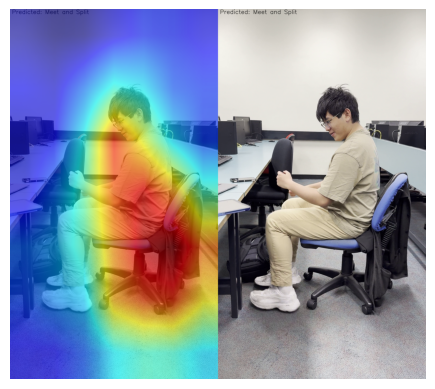

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 633.1ms
Speed: 29.1ms preprocess, 633.1ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...
Making prediction...
1/1 [==============================] - 0s 76ms/step
Soft Vote: Meet and Split
Hard Vote: Meet and Split

Model: LSTM
Clapping: 0.69%
Meet and Split: 82.37%
Sitting: 0.18%
Standing Still: 13.46%
Walking: 0.54%
Walking While Reading Book: 1.52%
Walking While Using Phone: 1.23%



Model: Dense
Clapping: 13.71%
Meet and Split: 16.84%
Sitting: 14.59%
Standing Still: 15.52%
Walking: 14.62%
Walking While Reading Book: 12.67%
Walking While Using Phone: 12.05%



Model: CNN
Clapping: 1.29%
Meet and Split: 45.51%
Sitting: 14.02%
Standing Still: 2.89%
Walking: 23.39%
Walking While Reading Book: 5.52%
Walking While Using Phone: 7.39%


Predicted: Meet and Split


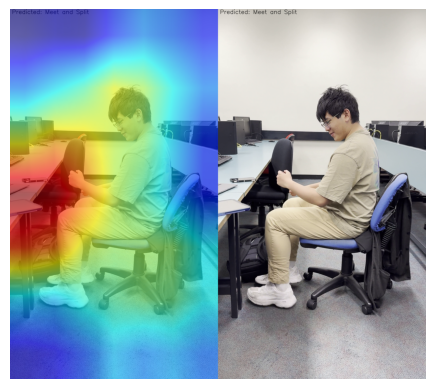

Processing frame...
Processing frame 0


0: 640x384 1 person, 1 backpack, 2 chairs, 1 laptop, 1 keyboard, 621.6ms
Speed: 26.5ms preprocess, 621.6ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...
Making prediction...
1/1 [==============================] - 0s 79ms/step
Soft Vote: Meet and Split
Hard Vote: Meet and Split

Model: LSTM
Clapping: 0.69%
Meet and Split: 80.62%
Sitting: 0.16%
Standing Still: 15.15%
Walking: 0.56%
Walking While Reading Book: 1.55%
Walking While Using Phone: 1.26%



Model: Dense
Clapping: 12.69%
Meet and Split: 16.96%
Sitting: 16.02%
Standing Still: 15.51%
Walking: 14.75%
Walking While Reading Book: 12.77%
Walking While Using Phone: 11.30%



Model: CNN
Clapping: 1.09%
Meet and Split: 38.07%
Sitting: 18.19%
Standing Still: 2.66%
Walking: 23.31%
Walking While Reading Book: 7.11%
Walking While Using Phone: 9.57%


Predicted: Meet and Split


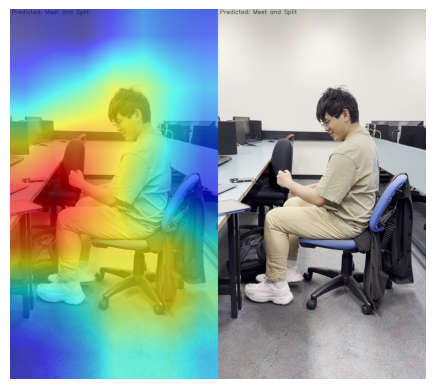

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 1 laptop, 1 keyboard, 612.2ms
Speed: 28.5ms preprocess, 612.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...
Making prediction...
1/1 [==============================] - 0s 70ms/step
Soft Vote: Meet and Split
Hard Vote: Meet and Split

Model: LSTM
Clapping: 0.69%
Meet and Split: 79.24%
Sitting: 0.15%
Standing Still: 16.56%
Walking: 0.57%
Walking While Reading Book: 1.52%
Walking While Using Phone: 1.26%



Model: Dense
Clapping: 13.06%
Meet and Split: 14.62%
Sitting: 13.63%
Standing Still: 15.81%
Walking: 15.38%
Walking While Reading Book: 15.09%
Walking While Using Phone: 12.41%



Model: CNN
Clapping: 1.11%
Meet and Split: 37.23%
Sitting: 17.83%
Standing Still: 2.48%
Walking: 24.55%
Walking While Reading Book: 7.29%
Walking While Using Phone: 9.50%


Predicted: Meet and Split


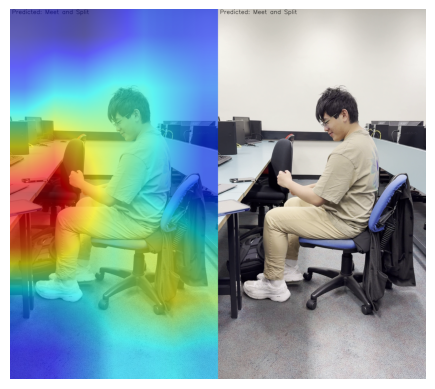

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 1 laptop, 1 keyboard, 691.4ms
Speed: 29.0ms preprocess, 691.4ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...
Making prediction...
1/1 [==============================] - 0s 70ms/step
Soft Vote: Meet and Split
Hard Vote: Meet and Split

Model: LSTM
Clapping: 0.71%
Meet and Split: 77.56%
Sitting: 0.15%
Standing Still: 18.17%
Walking: 0.59%
Walking While Reading Book: 1.55%
Walking While Using Phone: 1.27%



Model: Dense
Clapping: 13.83%
Meet and Split: 14.33%
Sitting: 13.46%
Standing Still: 17.46%
Walking: 15.26%
Walking While Reading Book: 12.87%
Walking While Using Phone: 12.79%



Model: CNN
Clapping: 1.17%
Meet and Split: 39.72%
Sitting: 17.83%
Standing Still: 2.46%
Walking: 22.68%
Walking While Reading Book: 6.79%
Walking While Using Phone: 9.34%


Predicted: Meet and Split


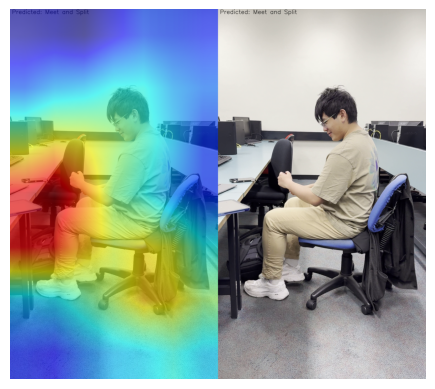

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 1 laptop, 1 keyboard, 646.2ms
Speed: 28.0ms preprocess, 646.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...
Making prediction...
1/1 [==============================] - 0s 70ms/step
Soft Vote: Meet and Split
Hard Vote: Meet and Split

Model: LSTM
Clapping: 0.74%
Meet and Split: 76.25%
Sitting: 0.14%
Standing Still: 19.37%
Walking: 0.61%
Walking While Reading Book: 1.59%
Walking While Using Phone: 1.30%



Model: Dense
Clapping: 12.83%
Meet and Split: 14.59%
Sitting: 15.51%
Standing Still: 19.92%
Walking: 14.22%
Walking While Reading Book: 11.97%
Walking While Using Phone: 10.97%



Model: CNN
Clapping: 1.19%
Meet and Split: 41.18%
Sitting: 16.37%
Standing Still: 2.42%
Walking: 23.37%
Walking While Reading Book: 6.63%
Walking While Using Phone: 8.84%


Predicted: Meet and Split


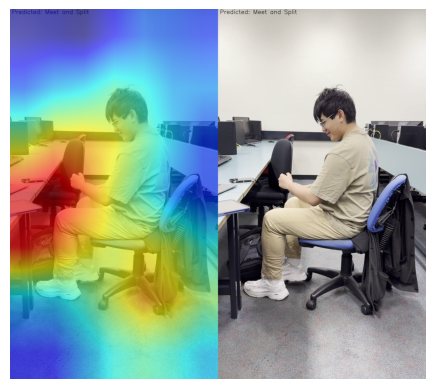

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 1 laptop, 1 keyboard, 609.2ms
Speed: 28.0ms preprocess, 609.2ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...
Making prediction...
1/1 [==============================] - 0s 73ms/step
Soft Vote: Meet and Split
Hard Vote: Meet and Split

Model: LSTM
Clapping: 0.77%
Meet and Split: 74.74%
Sitting: 0.14%
Standing Still: 20.75%
Walking: 0.63%
Walking While Reading Book: 1.63%
Walking While Using Phone: 1.35%



Model: Dense
Clapping: 13.77%
Meet and Split: 12.98%
Sitting: 15.43%
Standing Still: 18.60%
Walking: 14.08%
Walking While Reading Book: 10.53%
Walking While Using Phone: 14.61%



Model: CNN
Clapping: 1.18%
Meet and Split: 42.17%
Sitting: 14.65%
Standing Still: 2.35%
Walking: 24.98%
Walking While Reading Book: 6.52%
Walking While Using Phone: 8.15%


Predicted: Meet and Split


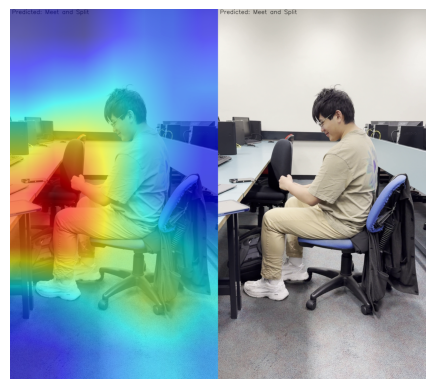

Processing frame...
Processing frame 0


0: 640x384 1 person, 2 chairs, 1 laptop, 1 keyboard, 648.3ms
Speed: 27.0ms preprocess, 648.3ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 384)


Filter detections
Select best box
Extract ROI
Extract Keypoints
Generating heatmap...
Processing ROI...


C:\Users\Duc Anh\AppData\Roaming\Python\Python310\site-packages\torch\nn\modules\module.py:1344: UserWarning: Using a non-full backward hook when the forward contains multiple autograd Nodes is deprecated and will be removed in future versions. This hook will be missing some grad_input. Please use register_full_backward_hook to get the documented behavior.
  warnings.warn("Using a non-full backward hook when the forward contains multiple autograd Nodes "


Extracting spatial and temporal features...
Transforming features...
Combining features...
Making prediction...
1/1 [==============================] - 0s 78ms/step
Soft Vote: Meet and Split
Hard Vote: Meet and Split

Model: LSTM
Clapping: 0.79%
Meet and Split: 74.53%
Sitting: 0.13%
Standing Still: 20.89%
Walking: 0.65%
Walking While Reading Book: 1.62%
Walking While Using Phone: 1.39%



Model: Dense
Clapping: 15.12%
Meet and Split: 14.95%
Sitting: 13.45%
Standing Still: 14.86%
Walking: 15.41%
Walking While Reading Book: 10.96%
Walking While Using Phone: 15.25%



Model: CNN
Clapping: 1.16%
Meet and Split: 44.15%
Sitting: 13.38%
Standing Still: 2.52%
Walking: 25.21%
Walking While Reading Book: 5.98%
Walking While Using Phone: 7.59%


Predicted: Meet and Split


In [ ]:
from predict import predict_on_video
predict_on_video(video_path,
                 output_video,
                 CLASSES_LIST,
                 dense_model,
                 lstm_model,
                 cnn_model,
                 yolo_model,
                 spatial_resnet,
                 spatial_transformer,
                 temporal_resnet, 
                 temporal_transformer,
                 grad_cam,
                 SEQUENCE_LENGTH=50,
                 debug=True)